# Imports

In [1]:
import joblib
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from dataprep.eda import create_report

In [2]:
df = pd.read_csv('day.csv', parse_dates=['dteday'])
df.drop(['instant'], axis=1, inplace=True)
df.head()

,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,2018-01-01,1,0,1,0,6,0,2,14.110847,18.18125,80.5833,10.749882,331,654,985
1,2018-02-01,1,0,1,0,0,0,2,14.902598,17.68695,69.6087,16.652113,131,670,801
2,2018-03-01,1,0,1,0,1,1,1,8.050924,9.47025,43.7273,16.636703,120,1229,1349
3,2018-04-01,1,0,1,0,2,1,1,8.200000,10.60610,59.0435,10.739832,108,1454,1562
4,2018-05-01,1,0,1,0,3,1,1,9.305237,11.46350,43.6957,12.522300,82,1518,1600


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 499 entries, 0 to 498
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   dteday      499 non-null    datetime64[ns]
 1   season      499 non-null    int64         
 2   yr          499 non-null    int64         
 3   mnth        499 non-null    int64         
 4   holiday     499 non-null    int64         
 5   weekday     499 non-null    int64         
 6   workingday  499 non-null    int64         
 7   weathersit  499 non-null    int64         
 8   temp        499 non-null    float64       
 9   atemp       499 non-null    float64       
 10  hum         499 non-null    float64       
 11  windspeed   499 non-null    float64       
 12  casual      499 non-null    int64         
 13  registered  499 non-null    int64         
 14  cnt         499 non-null    int64         
dtypes: datetime64[ns](1), float64(4), int64(10)
memory usage: 58.6 KB


In [4]:
df.describe()

,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
count,499.000000,499.000000,499.000000,499.000000,499.000000,499.000000,499.000000,499.000000,499.000000,499.000000,499.000000,499.000000,499.000000,499.000000
mean,2.206413,0.268537,5.515030,0.028056,2.995992,0.683367,1.408818,18.979325,22.316516,62.601307,13.212513,706.577154,3030.551102,3737.128257
std,1.095573,0.443643,3.459066,0.165299,2.009012,0.465630,0.557175,7.350670,8.038017,15.282889,5.278390,612.099032,1194.650805,1538.501032
min,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,2.424346,3.953480,0.000000,1.500244,9.000000,416.000000,431.000000
25%,1.000000,0.000000,3.000000,0.000000,1.000000,0.000000,1.000000,12.998189,15.843550,50.666050,9.313000,226.500000,2111.500000,2463.000000
50%,2.000000,0.000000,5.000000,0.000000,3.000000,1.000000,1.000000,18.518347,22.222300,62.666700,12.707689,603.000000,3176.000000,3926.000000
75%,3.000000,1.000000,8.000000,0.000000,5.000000,1.000000,2.000000,25.215000,28.725925,73.791650,16.083618,900.000000,3845.500000,4761.500000
max,4.000000,1.000000,12.000000,1.000000,6.000000,1.000000,3.000000,34.815847,42.044800,97.250000,34.000021,3252.000000,5950.000000,8362.000000


In [6]:
for col in df.columns[1:-1]:
    print(col)
    print(df[col].value_counts())
    print("~"*18)

season
1    169
2    147
3     94
4     89
Name: season, dtype: int64
~~~~~~~~~~~~~~~~~~
yr
0    365
1    134
Name: yr, dtype: int64
~~~~~~~~~~~~~~~~~~
mnth
1     62
3     62
4     60
2     56
5     45
7     31
8     31
10    31
12    31
6     30
9     30
11    30
Name: mnth, dtype: int64
~~~~~~~~~~~~~~~~~~
holiday
0    485
1     14
Name: holiday, dtype: int64
~~~~~~~~~~~~~~~~~~
weekday
0    72
1    72
6    72
2    71
4    71
5    71
3    70
Name: weekday, dtype: int64
~~~~~~~~~~~~~~~~~~
workingday
1    341
0    158
Name: workingday, dtype: int64
~~~~~~~~~~~~~~~~~~
weathersit
1    312
2    170
3     17
Name: weathersit, dtype: int64
~~~~~~~~~~~~~~~~~~
temp
26.035000    4
10.899153    4
30.613347    3
27.606653    3
19.372500    3
            ..
16.570847    1
6.833347     1
17.288347    1
31.809153    1
17.425000    1
Name: temp, Length: 386, dtype: int64
~~~~~~~~~~~~~~~~~~
atemp
12.15290    2
17.58145    2
11.39565    2
23.32625    2
27.14645    2
           ..
13.54165    1
20.29605 

  Created wheel for bottleneck: filename=Bottleneck-1.3.2-cp38-cp38-win_amd64.whl size=108141 sha256=93854feded64fc110849d212670655db97a112c0a0bc22aed7217d3b3e68b115
  Stored in directory: c:\users\lenovo\appdata\local\pip\cache\wheels\29\60\c9\98f744fb5c7d1ffb38d096318d9e873a08c0f5df07d6487626
  Created wheel for python-Levenshtein: filename=python_Levenshtein-0.12.2-cp38-cp38-win_amd64.whl size=83814 sha256=dd30098f9b97d6bbbef6f72cc11d35bd97d1cbe1fe2108fd8b8df20e87a7d186
  Stored in directory: c:\users\lenovo\appdata\local\pip\cache\wheels\d7\0c\76\042b46eb0df65c3ccd0338f791210c55ab79d209bcc269e2c7
Successfully built bottleneck python-Levenshtein
  Attempting uninstall: jinja2
    Found existing installation: Jinja2 3.0.1
    Uninstalling Jinja2-3.0.1:
      Successfully uninstalled Jinja2-3.0.1
  Attempting uninstall: regex
    Found existing installation: regex 2021.4.4
    Uninstalling regex-2021.4.4:
      Successfully uninstalled regex-2021.4.4
  Attempting uninstall: dask
    F

  0%|                                                                                         | 0/2255 [00:00<…

DataPrep Report
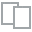
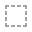
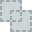
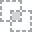
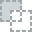
...
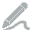
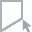
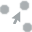
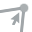
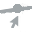

In [10]:
create_report(df)

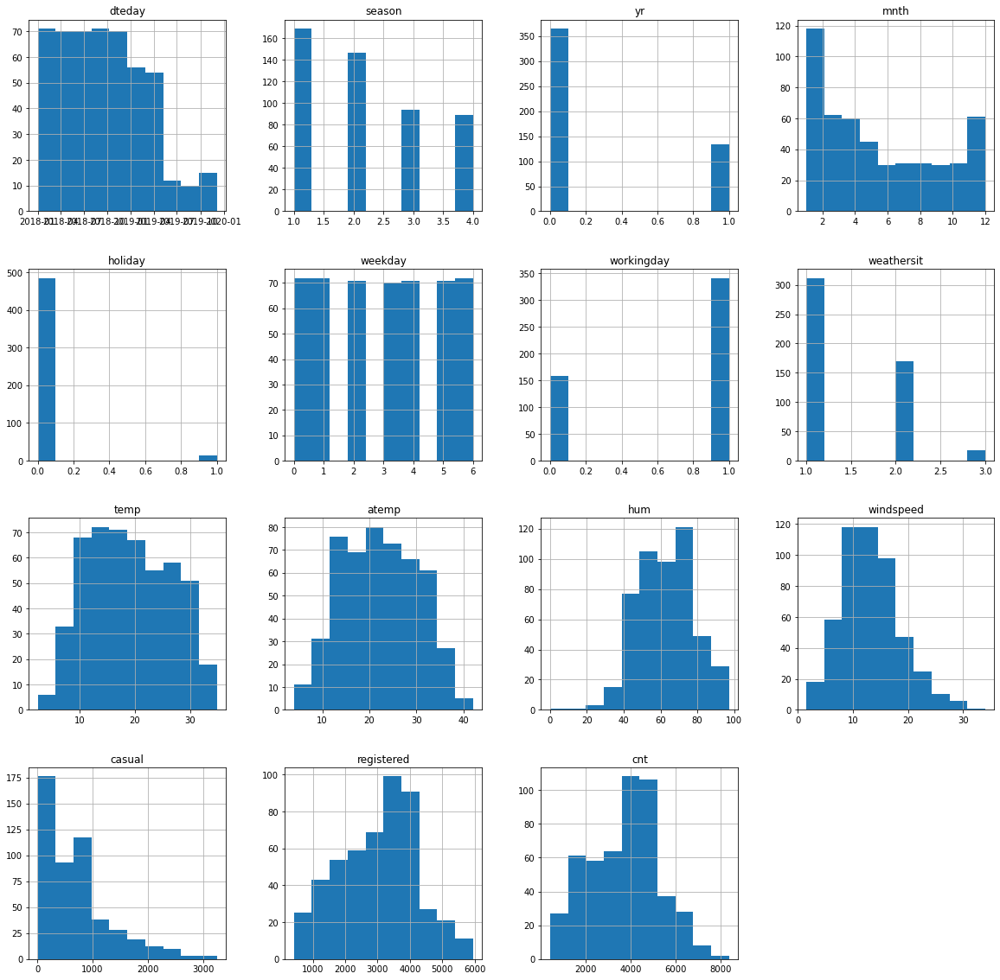

In [5]:
df.hist(figsize=(20, 20))
plt.show()

<AxesSubplot:xlabel='weekday'>

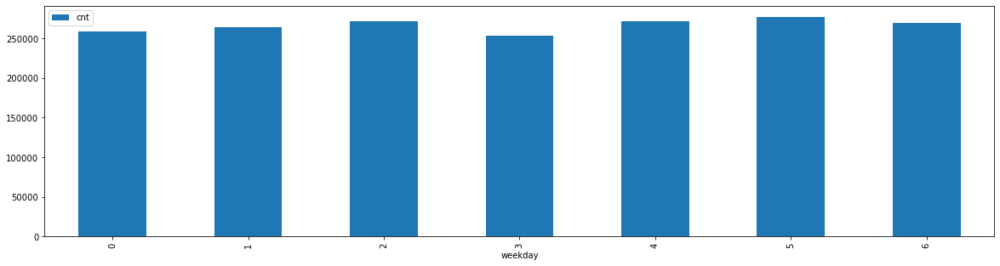

In [6]:
df[['weekday', 'cnt']].groupby(['weekday']).sum().plot(kind='bar', figsize=(20, 5))

<AxesSubplot:xlabel='weathersit'>

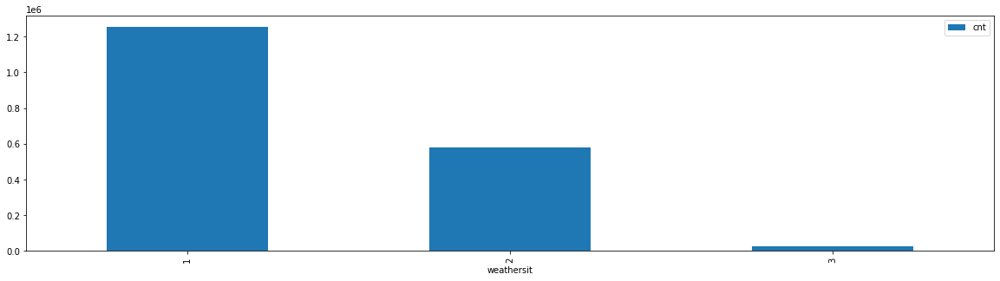

In [7]:
df[['weathersit', 'cnt']].groupby(['weathersit']).sum().plot(kind='bar', figsize=(20, 5))

<AxesSubplot:xlabel='mnth'>

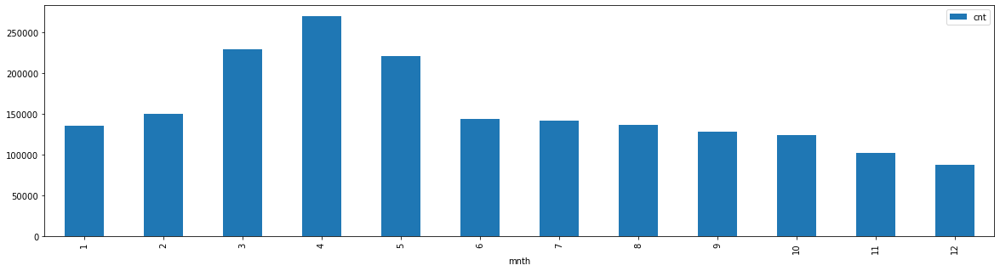

In [8]:
df[['mnth', 'cnt']].groupby(['mnth']).sum().plot(kind='bar', figsize=(20, 5))

In [9]:
df.corr()

,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
season,1.000000,-0.440651,0.865255,-0.009866,-0.001448,0.010286,0.048987,0.443957,0.447903,0.262581,-0.226985,0.212756,0.256280,0.283648
yr,-0.440651,1.000000,-0.482860,0.006585,-0.010055,-0.005552,-0.038843,-0.218894,-0.210723,-0.190814,0.121607,0.078743,0.417900,0.355828
mnth,0.865255,-0.482860,1.000000,0.009797,0.015901,0.002961,0.029104,0.383480,0.390125,0.264647,-0.232266,0.143103,0.175519,0.193226
holiday,-0.009866,0.006585,0.009797,1.000000,-0.102455,-0.249598,-0.037576,-0.028749,-0.038892,-0.049892,0.035696,0.040028,-0.107448,-0.067509
weekday,-0.001448,-0.010055,0.015901,-0.102455,1.000000,0.035133,0.058871,-0.012603,-0.012535,-0.027003,0.016162,0.026341,0.042210,0.043256
workingday,0.010286,-0.005552,0.002961,-0.249598,0.035133,1.000000,0.058771,0.058716,0.063088,0.026035,-0.009758,-0.502092,0.326616,0.053859
weathersit,0.048987,-0.038843,0.029104,-0.037576,0.058871,0.058771,1.000000,-0.070571,-0.072851,0.584478,0.026112,-0.216683,-0.266699,-0.293301
temp,0.443957,-0.218894,0.383480,-0.028749,-0.012603,0.058716,-0.070571,1.000000,0.996325,0.184930,-0.132151,0.527648,0.525363,0.617873
atemp,0.447903,-0.210723,0.390125,-0.038892,-0.012535,0.063088,-0.072851,0.996325,1.000000,0.195306,-0.157681,0.531608,0.537689,0.629020
hum,0.262581,-0.190814,0.264647,-0.049892,-0.027003,0.026035,0.584478,0.184930,0.195306,1.000000,-0.279102,-0.042922,-0.095201,-0.091001


season        0.283648
yr            0.355828
mnth          0.193226
holiday      -0.067509
weekday       0.043256
workingday    0.053859
weathersit   -0.293301
temp          0.617873
atemp         0.629020
hum          -0.091001
windspeed    -0.184454
casual        0.697908
registered    0.930240
cnt           1.000000
Name: cnt, dtype: float64


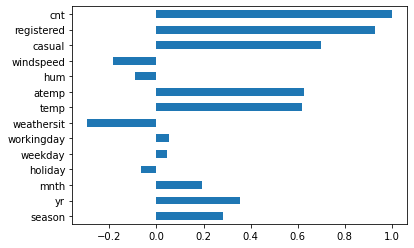

In [11]:
df.corr().iloc[:, -1].plot(kind='barh')
print(df.corr().iloc[:, -1])

In [12]:
df.drop(['dteday', 'holiday', 'workingday'], axis = 1, inplace=True)
df.head()

,season,yr,mnth,weekday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,0,1,6,2,14.110847,18.18125,80.5833,10.749882,331,654,985
1,1,0,1,0,2,14.902598,17.68695,69.6087,16.652113,131,670,801
2,1,0,1,1,1,8.050924,9.47025,43.7273,16.636703,120,1229,1349
3,1,0,1,2,1,8.200000,10.60610,59.0435,10.739832,108,1454,1562
4,1,0,1,3,1,9.305237,11.46350,43.6957,12.522300,82,1518,1600


In [15]:
x = df.iloc[:, :-1]
y = df.iloc[:, -1]

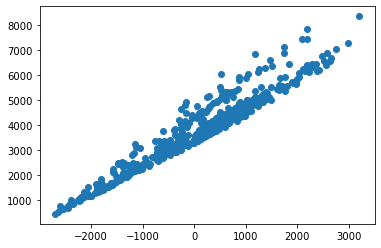

In [16]:
pca_array = pca.fit_transform(x)
plt.scatter(pca_array,y)

# Splitting the data

In [17]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.33, random_state=42)

# LINEAR MODEL

In [42]:
lr = LinearRegression()
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
lr.score(X_test, y_test)

1.0

In [29]:
df1 = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})  
df1

,Actual,Predicted
460,6460,6460.0
73,2056,2056.0
231,5191,5191.0
175,5202,5202.0
237,4661,4661.0
...,...,...
294,4308,4308.0
185,4665,4665.0
26,431,431.0
7,959,959.0


In [69]:
print(f"MEAN SQUARED ERROR: {mean_squared_error(y_test, y_pred)}")
print(f"ROOT MEAN SQUARED ERROR: {math.sqrt(mean_squared_error(y_test, y_pred))}")

MEAN SQUARED ERROR: 1.4865164090503736e-24
ROOT MEAN SQUARED ERROR: 1.2192277921087484e-12


In [44]:
x.head(1)

,season,yr,mnth,weekday,weathersit,temp,atemp,hum,windspeed,casual,registered
0,1,0,1,6,2,14.110847,18.18125,80.5833,10.749882,331,654


In [49]:
lr.predict([[1,0,1,6,2,14.110847,18.1812,80.5833,10.749882,331,654]])

array([985.])

In [63]:
#save model
filename = 'finalized_model.sav'
joblib.dump(lr, filename)

['finalized_model.sav']

In [67]:
#load model
loaded_model = joblib.load(filename)
result = loaded_model.score(X_test, y_test)
print(result)

1.0
